#### Installation for necessary libraries 

In [1]:
#pip install dash
# !pip install jupyter-dash

###### ---------------------------------------------------------------

#### Importing necessary libraries 

In [2]:
import pandas as pd  # Import pandas
import plotly.express as px  # Import plotly
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd

#### -------------------------------------------------------------------

##### loding datasets 

In [3]:
df = pd.read_csv('CDHT_with_HT_CD_features.csv')  

###### -----------------------------------------------------------------

##### EDA For Numerical feature 

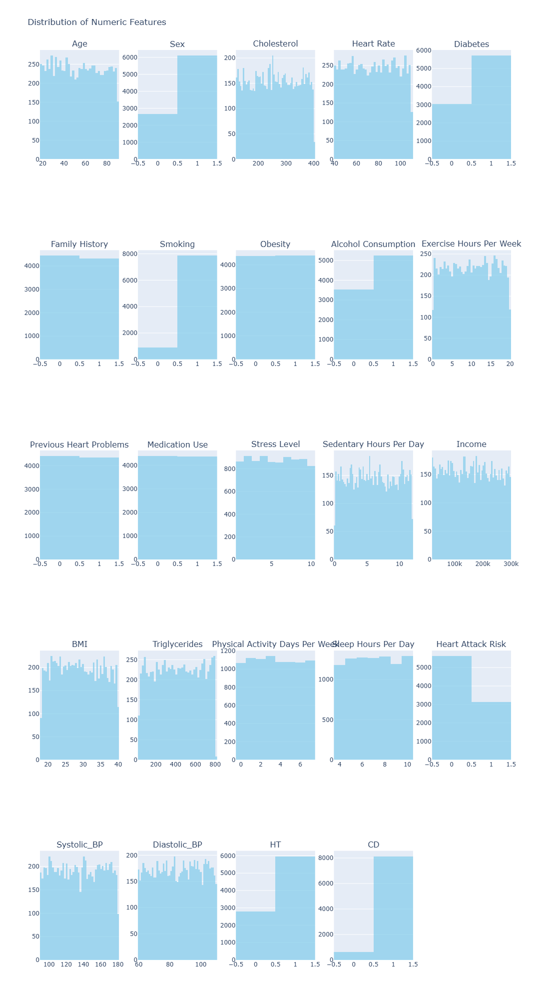

In [4]:
import plotly.graph_objects as go
import plotly.subplots as sp
# Selecting  numeric columns
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
# Creating a subplot for each numeric feature
n_rows = (len(numeric_columns) + 4) // 5  # Adjust rows for a grid layout
fig = sp.make_subplots(rows=n_rows, cols=5, subplot_titles=numeric_columns)
for i, col in enumerate(numeric_columns):
    row = i // 5 + 1
    col_pos = i % 5 + 1
    fig.add_trace(go.Histogram(x=df[col], name=col, marker=dict(color='skyblue'), opacity=0.75), row=row, col=col_pos)
fig.update_layout(title_text="Distribution of Numeric Features", height=400*n_rows, showlegend=False)
fig.show()

##### ------------------------------------------------------------------------------------------------

##### EDA for Categorical features 

In [5]:
categorical_columns = [
    'Sex', 'Diabetes', 'Family History', 'Smoking', 'Obesity', 
    'Alcohol Consumption', 'Previous Heart Problems', 'Medication Use', 
    'Blood_Pressure_Status'
]

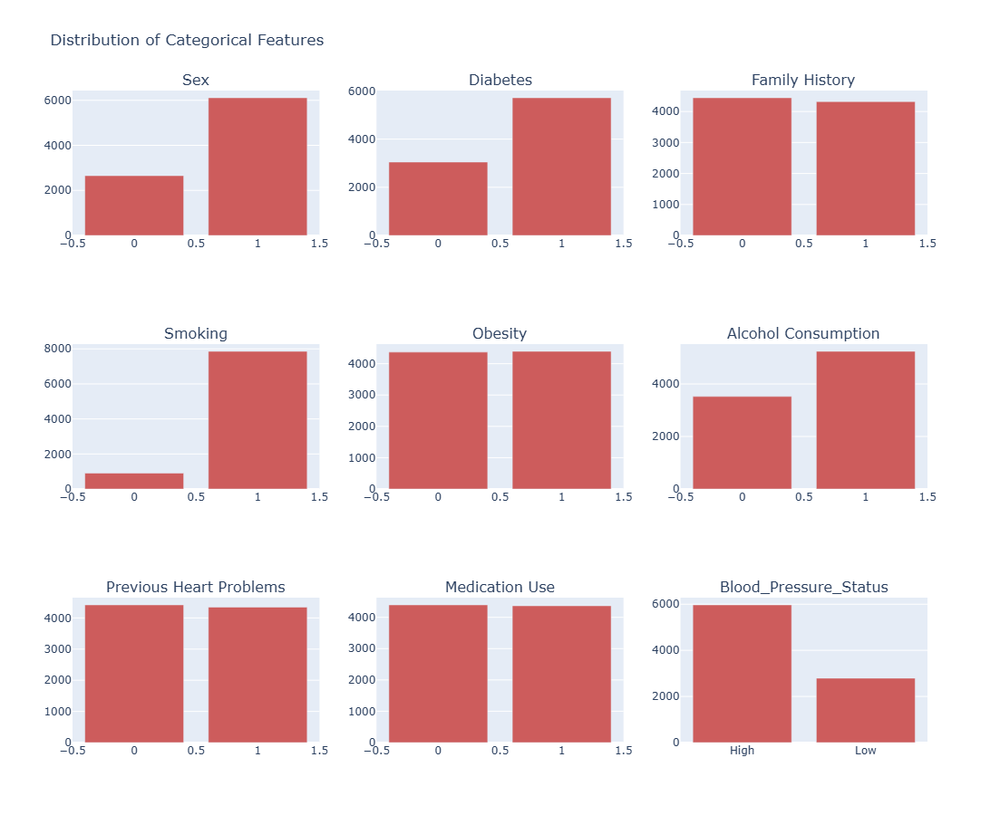

In [6]:
import plotly.graph_objects as go
import plotly.subplots as sp
# Definining the layout for subplots
n_rows = (len(categorical_columns) + 2) // 3  # Adjusted rows for a grid layout
fig = sp.make_subplots(rows=n_rows, cols=3, subplot_titles=categorical_columns)
for i, col in enumerate(categorical_columns):
    row = i // 3 + 1
    col_pos = i % 3 + 1
    fig.add_trace(
        go.Bar(
            x=df[col].value_counts().index,
            y=df[col].value_counts().values,
            name=col,
            marker_color='indianred'
        ),
        row=row, col=col_pos
    )
fig.update_layout(
    title="Distribution of Categorical Features",
    height=300*n_rows,
    showlegend=False
)
fig.show()

##### ------------------------------------------------------------------------------------------------------------------------------------------------

#### Age Vs Cholestrol level 

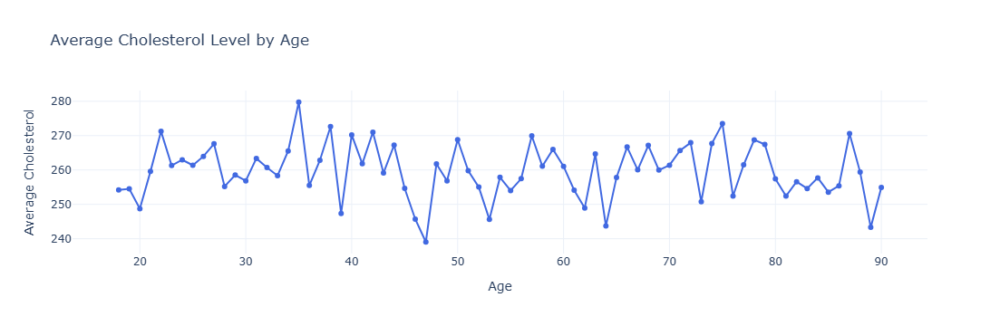

In [7]:
# Aggregated data by age to get mean cholesterol level for each age group
age_cholesterol = df.groupby('Age')['Cholesterol'].mean().reset_index()
# Created line graph for Cholesterol vss Age
fig_line = go.Figure()
fig_line.add_trace(go.Scatter(
    x=age_cholesterol['Age'],
    y=age_cholesterol['Cholesterol'],
    mode='lines+markers',
    name='Cholesterol',
    line=dict(color='royalblue', width=2)
))
fig_line.update_layout(
    title="Average Cholesterol Level by Age",
    xaxis_title="Age",
    yaxis_title="Average Cholesterol",
    template="plotly_white"
)
fig_line.show()

##### -----------------------------------------------------------------------------------------

#### Average Cholestrol level  by Hypertension status 

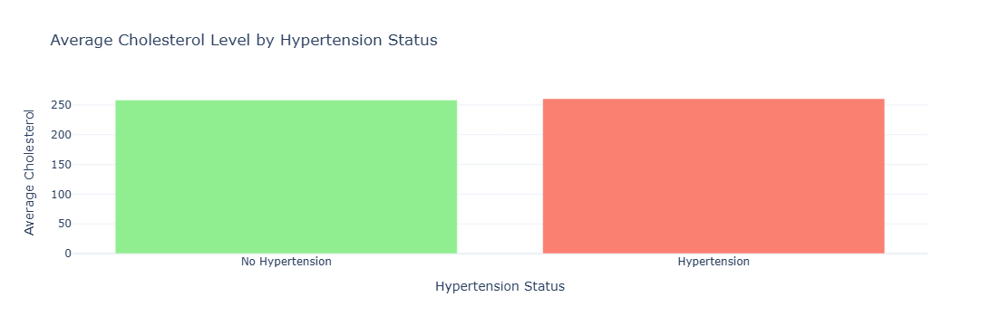

In [8]:
# Aggregated data by hypertension status to get mean cholesterol level
ht_cholesterol = df.groupby('HT')['Cholesterol'].mean().reset_index()
# Create barrgraph for Cholesterol vs Hypertensionn
fig_bar = go.Figure()
fig_bar.add_trace(go.Bar(
    x=['No Hypertension', 'Hypertension'],
    y=ht_cholesterol['Cholesterol'],
    name='Average Cholesterol',
    marker_color=['lightgreen', 'salmon']
))
fig_bar.update_layout(
    title="Average Cholesterol Level by Hypertension Status",
    xaxis_title="Hypertension Status",
    yaxis_title="Average Cholesterol",
    template="plotly_white"
)
fig_bar.show()

##### ---------------------------------------------------------------------------------------------------------------

#### Average BMI by Age 

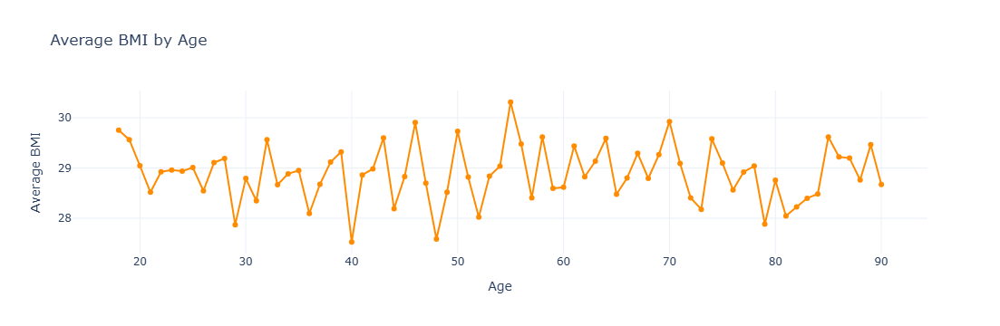

In [9]:
# Aggregated data by age to get the mean BMI for each agee groeup
age_bmi = df.groupby('Age')['BMI'].mean().reset_index()
# Created line graph for BMI vs Age
fig_bmi_age = go.Figure()
fig_bmi_age.add_trace(go.Scatter(
    x=age_bmi['Age'],
    y=age_bmi['BMI'],
    mode='lines+markers',
    name='BMI',
    line=dict(color='darkorange', width=2)
))
fig_bmi_age.update_layout(
    title="Average BMI by Age",
    xaxis_title="Age",
    yaxis_title="Average BMI",
    template="plotly_white"
)
fig_bmi_age.show()

##### ----------------------------------------------------------------------------------------

#### Obesity levels by hypertension status 

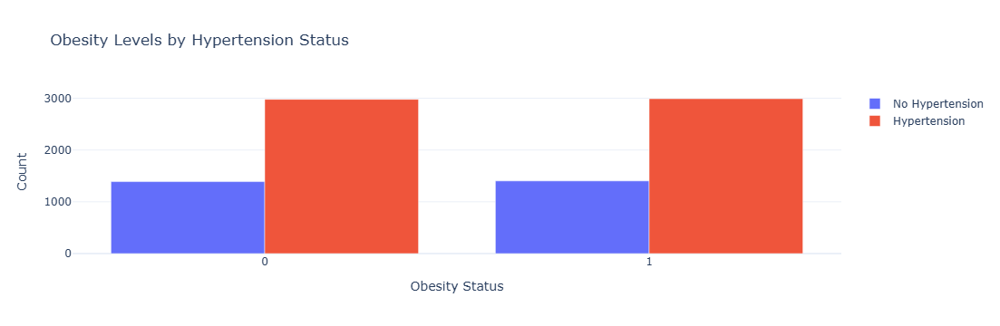

In [10]:
# Aggregating data by obesity status and hypertension status
obesity_ht = df.groupby(['Obesity', 'HT']).size().unstack().fillna(0)
obesity_ht.columns = ['No Hypertension', 'Hypertension']
# Createed bar graph for Obesity vs Hypertension
fig_obesity_ht = go.Figure()
for ht_status in obesity_ht.columns:
    fig_obesity_ht.add_trace(go.Bar(
        x=obesity_ht.index,
        y=obesity_ht[ht_status],
        name=ht_status
    ))
fig_obesity_ht.update_layout(
    barmode='group',
    title="Obesity Levels by Hypertension Status",
    xaxis_title="Obesity Status",
    yaxis_title="Count",
    template="plotly_white"
)
fig_obesity_ht.show()

##### ------------------------------------------------------------------------------

#### Average systolic Blood pressure by Age 

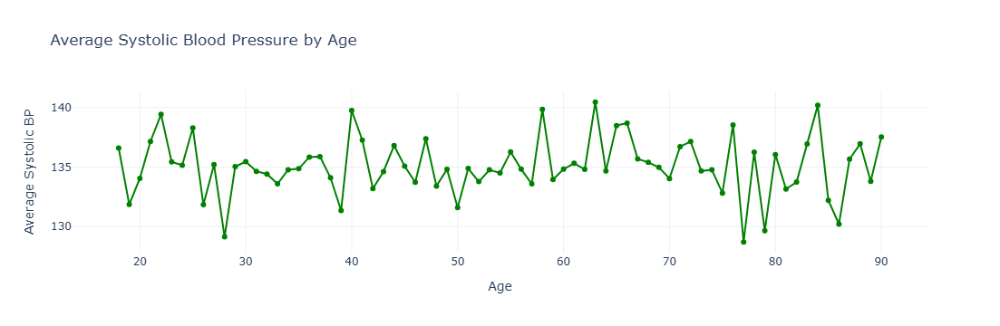

In [11]:
# Aggregated data by age to get mean systolic blood pressure for each age groups
age_systolic = df.groupby('Age')['Systolic_BP'].mean().reset_index()
# Created line graph f or  for Systolic Blood Pressure vs Age
fig_systolic_age = go.Figure()
fig_systolic_age.add_trace(go.Scatter(
    x=age_systolic['Age'],
    y=age_systolic['Systolic_BP'],
    mode='lines+markers',
    name='Systolic BP',
    line=dict(color='green', width=2)
))
fig_systolic_age.update_layout(
    title="Average Systolic Blood Pressure by Age",
    xaxis_title="Age",
    yaxis_title="Average Systolic BP",
    template="plotly_white"
)
fig_systolic_age.show()

##### ------------------------------------------------------------------------------------------------------------------

#### Hypertension by Family history of Heart Dieases 

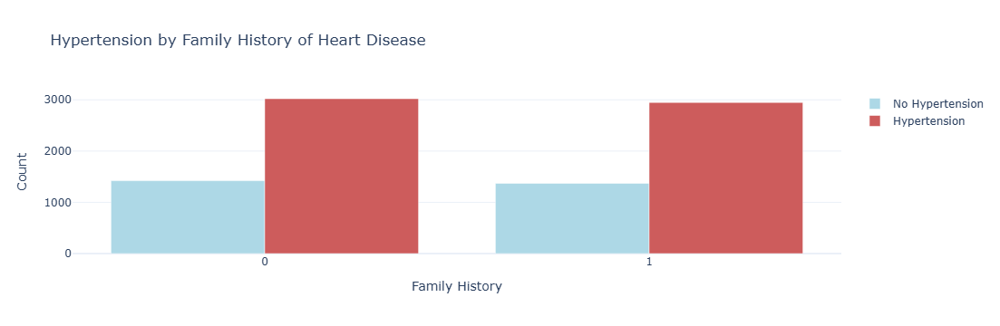

In [12]:
# Aggregated data by family history and hypertension status(0,1)
family_ht = df.groupby(['Family History', 'HT']).size().unstack().fillna(0)
family_ht.columns = ['No Hypertension', 'Hypertension']
# Create bar graph for Family History vs Hypertension
fig_family_ht = go.Figure()
for ht_status in family_ht.columns:
    fig_family_ht.add_trace(go.Bar(
        x=family_ht.index,
        y=family_ht[ht_status],
        name=ht_status,
        marker_color='indianred' if ht_status == 'Hypertension' else 'lightblue'
    ))
fig_family_ht.update_layout(
    barmode='group',
    title="Hypertension by Family History of Heart Disease",
    xaxis_title="Family History",
    yaxis_title="Count",
    template="plotly_white"
)
fig_family_ht.show()

#### ---------------------------------------------------------

#### Hypertension status by smoking

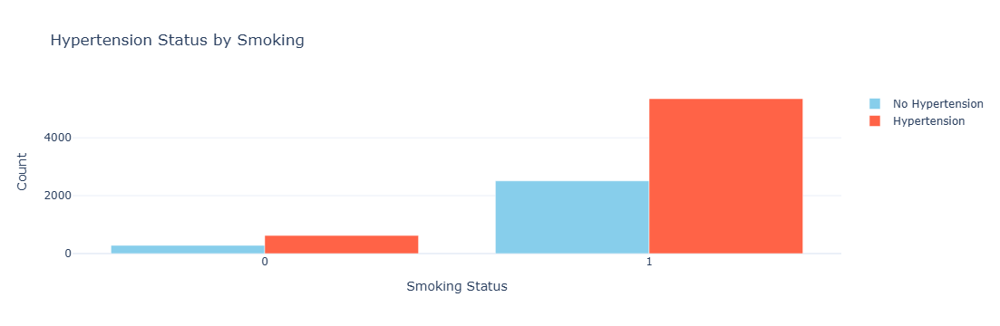

In [13]:
# Aggregated data by smoking status and hypertension status
smoking_ht = df.groupby(['Smoking', 'HT']).size().unstack().fillna(0)
smoking_ht.columns = ['No Hypertension', 'Hypertension']
# Created  simple bar graph for Smoking vs Hypertension
fig_smoking_ht = go.Figure()
for ht_status in smoking_ht.columns:
    fig_smoking_ht.add_trace(go.Bar(
        x=smoking_ht.index,
        y=smoking_ht[ht_status],
        name=ht_status,
        marker_color='tomato' if ht_status == 'Hypertension' else 'skyblue'
    ))
fig_smoking_ht.update_layout(
    barmode='group',
    title="Hypertension Status by Smoking",
    xaxis_title="Smoking Status",
    yaxis_title="Count",
    template="plotly_white"
)
fig_smoking_ht.show()

#### ---------------------------------------------------------------------------------------------

#### Average Heart Rate by Age 

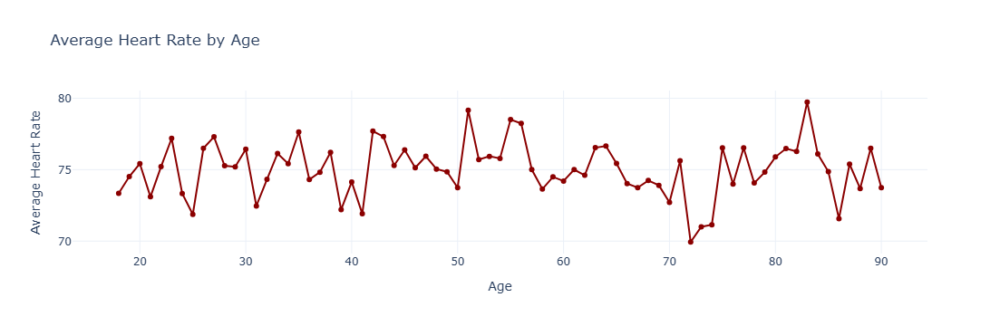

In [14]:
# Aggregate  age to get mean heart rate for each age group
age_heart_rate = df.groupby('Age')['Heart Rate'].mean().reset_index()
# Created line graph for Heart Rate vs Age
fig_heart_rate_age = go.Figure()
fig_heart_rate_age.add_trace(go.Scatter(
    x=age_heart_rate['Age'],
    y=age_heart_rate['Heart Rate'],
    mode='lines+markers',
    name='Heart Rate',
    line=dict(color='darkred', width=2)
))
fig_heart_rate_age.update_layout(
    title="Average Heart Rate by Age",
    xaxis_title="Age",
    yaxis_title="Average Heart Rate",
    template="plotly_white"
)
fig_heart_rate_age.show()

##### -------------------------------------------------------------------------------------------------------------------

##### Alcohol Consumption by Obisity status 

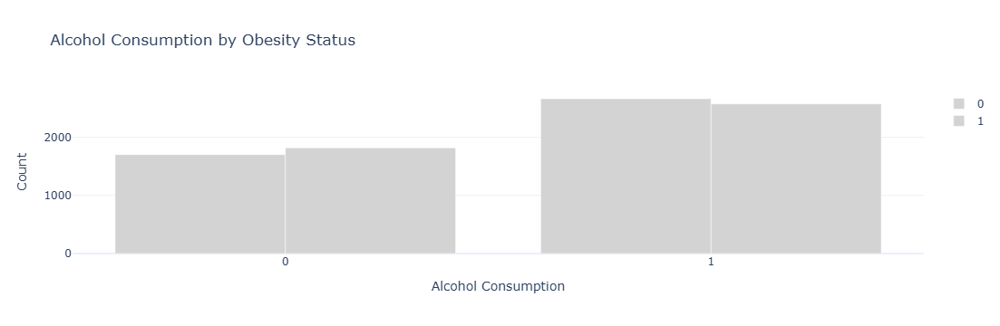

In [15]:
# Aggregate data by alcohol consumption and obesity
alcohol_obesity = df.groupby(['Alcohol Consumption', 'Obesity']).size().unstack().fillna(0)
# Created bar graph for Alcohol Consumption vs Obesity featuree
fig_alcohol_obesity = go.Figure()
for obesity_status in alcohol_obesity.columns:
    fig_alcohol_obesity.add_trace(go.Bar(
        x=alcohol_obesity.index,
        y=alcohol_obesity[obesity_status],
        name=obesity_status,
        marker_color='teal' if obesity_status == 'Yes' else 'lightgrey'
    ))
fig_alcohol_obesity.update_layout(
    barmode='group',
    title="Alcohol Consumption by Obesity Status",
    xaxis_title="Alcohol Consumption",
    yaxis_title="Count",
    template="plotly_white"
)
fig_alcohol_obesity.show()

#### --------------------------------------------------------------------------------------------------------

#### Average BMI by Gender(Group BY)

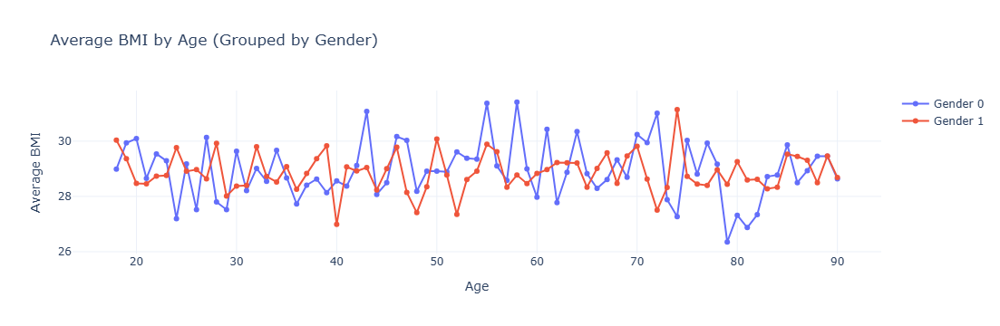

In [16]:
# Aggregartion  by age and gender to get mean BMI
age_gender_bmi = df.groupby(['Age', 'Sex'])['BMI'].mean().unstack().reset_index()
# Created line graph for Age vs BMI, grouped by Gender
fig_bmi_age_gender = go.Figure()
for gender in age_gender_bmi.columns[1:]:
    fig_bmi_age_gender.add_trace(go.Scatter(
        x=age_gender_bmi['Age'],
        y=age_gender_bmi[gender],
        mode='lines+markers',
        name=f"Gender {gender}",
        line=dict(width=2)
    ))
fig_bmi_age_gender.update_layout(
    title="Average BMI by Age (Grouped by Gender)",
    xaxis_title="Age",
    yaxis_title="Average BMI",
    template="plotly_white"
)
fig_bmi_age_gender.show()

##### --------------------------------------------------------------------------------------------------------------------

#### Average Cholestrol By Age 

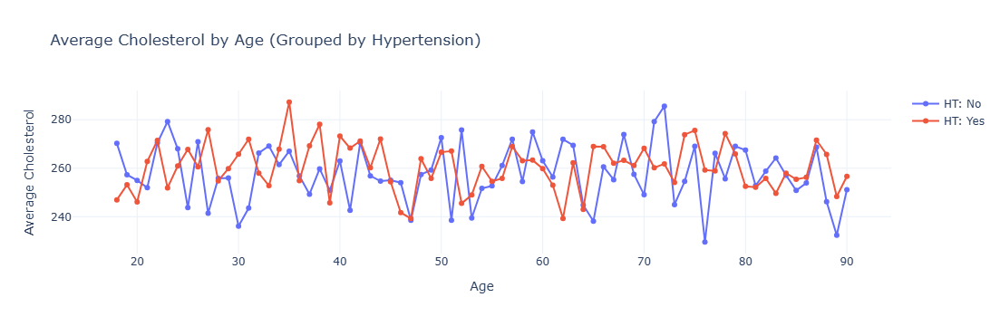

In [17]:
# Aggregate  age data and hypertension to get mean cholesterol
age_ht_cholesterol = df.groupby(['Age', 'HT'])['Cholesterol'].mean().unstack().reset_index()
# Created line graph for Cholesterol vs Age, grouped by Hypertension
fig_chol_age_ht = go.Figure()
for ht_status in age_ht_cholesterol.columns[1:]:
    fig_chol_age_ht.add_trace(go.Scatter(
        x=age_ht_cholesterol['Age'],
        y=age_ht_cholesterol[ht_status],
        mode='lines+markers',
        name=f"HT: {'Yes' if ht_status else 'No'}",
        line=dict(width=2)
    ))
fig_chol_age_ht.update_layout(
    title="Average Cholesterol by Age (Grouped by Hypertension)",
    xaxis_title="Age",
    yaxis_title="Average Cholesterol",
    template="plotly_white"
)
fig_chol_age_ht.show()

##### ------------------------------------------------------------------------------------------------------------------------

##### Systolic vs diastolic Blood pressure 

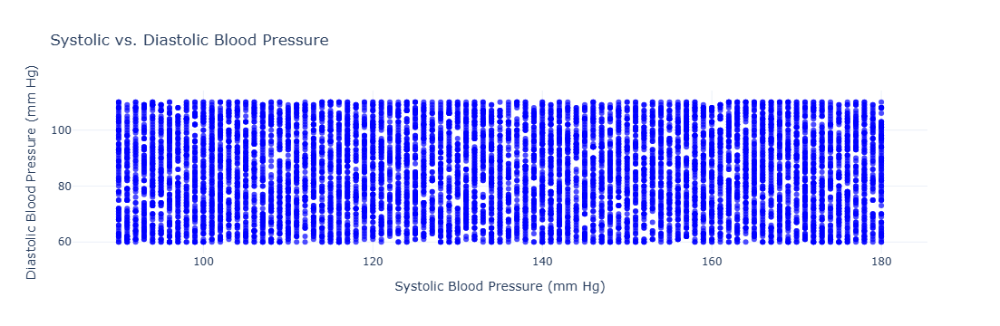

In [18]:
# scatter plot for Systolic vs. Diastolic Blood Pressure
fig_bp = go.Figure()
fig_bp.add_trace(go.Scatter(
    x=df['Systolic_BP'],
    y=df['Diastolic_BP'],
    mode='markers',
    marker=dict(color='blue', size=6, opacity=0.7),
    name='BP Points'
))
fig_bp.update_layout(
    title="Systolic vs. Diastolic Blood Pressure",
    xaxis_title="Systolic Blood Pressure (mm Hg)",
    yaxis_title="Diastolic Blood Pressure (mm Hg)",
    template="plotly_white"
)
fig_bp.show()

##### --------------------------------------------------------------------------

#### Corealtion matrix 

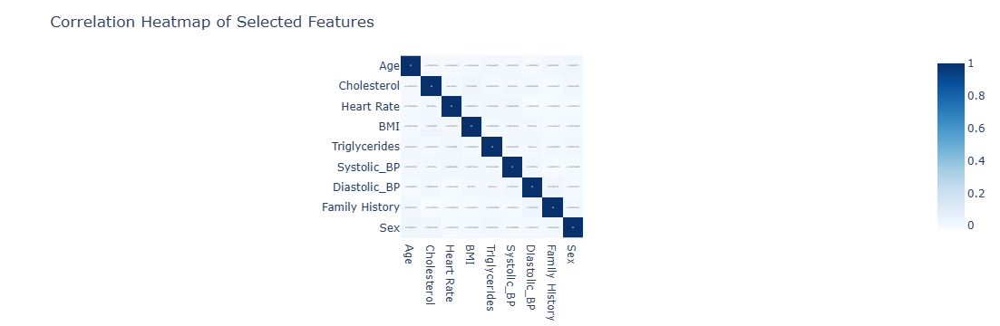

In [19]:
import plotly.express as px

# Specify the columns to include in the correlation heatmap
columns_to_include = ['Age', 'Cholesterol', 'Heart Rate', 'BMI', 'Triglycerides', 
                      'Systolic_BP', 'Diastolic_BP', 'Family History', 'Sex']

# Select only the specified columns from the dataframe
selected_data = df[columns_to_include]

# Ensure all selected columns are numeric
numeric_data = selected_data.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
correlation_matrix = numeric_data.corr()

# Create the heatmap using Plotly
fig = px.imshow(correlation_matrix, text_auto=True, color_continuous_scale="Blues")
fig.update_layout(title="Correlation Heatmap of Selected Features")
fig.show()


##### -------------------------------------------------------------------------------------------------------------------

### Dashboard 

In [20]:
# Preprocess Blood Pressure column if it exists
if 'Blood Pressure' in df.columns:
    df[['Systolic_BP', 'Diastolic_BP']] = df['Blood Pressure'].str.split('/', expand=True)
    df['Systolic_BP'] = pd.to_numeric(df['Systolic_BP'], errors='coerce')
    df['Diastolic_BP'] = pd.to_numeric(df['Diastolic_BP'], errors='coerce')
    df = df.drop('Blood Pressure', axis=1)
else:
    print("Column 'Blood Pressure' not found in the DataFrame")
# Initialize Dash app
app = dash.Dash(__name__)
# App layout
app.layout = html.Div(children=[
    html.H1(children='Predictive Modelling of Coronary Artery Disease and Hypertension'),
    # Gender filter dropdown
    html.Label('Filter by Gender:'),
    dcc.Dropdown(
        id='gender-filter',
        options=[
            {'label': 'Male', 'value': 1},
            {'label': 'Female', 'value': 0}
        ],
        value=None,
        placeholder="Select Gender"
    ),
    # Age range filter
    html.Label('Filter by Age Range:'),
    dcc.RangeSlider(
        id='age-range-filter',
        min=df['Age'].min(),
        max=df['Age'].max(),
        step=1,
        value=[df['Age'].min(), df['Age'].max()],
        marks={i: str(i) for i in range(int(df['Age'].min()), int(df['Age'].max())+1, 10)}
    ),
    # Summary Statistics Display
    html.H3('Summary Statistics'),
    dcc.Markdown(id='summary-stats'),
   # Histogram variable selector
    html.Label('Select a Variable for Histogram:'),
    dcc.Dropdown(
        id='histogram-var',
        options=[{'label': col, 'value': col} for col in ['Cholesterol', 'Age', 'BMI']],
        value='Cholesterol'
    ),
    dcc.Graph(id='histogram-graph'),
    # Scatter plot for Cholesterol vs Systolic_BP
    html.H3('Scatter Plot: Cholesterol vs Systolic Blood Pressure with Trend Line'),
    dcc.Graph(id='scatter-chol-systolic'),
    # Pie chart for Family History
    html.H3('Family History Proportion'),
    dcc.Graph(id='pie-family-history'),
    # Box plot for BMI
    html.H3('Boxplot of BMI'),
    dcc.Graph(id='box-bmi'),
    # Correlation heatmap
    html.H3('Correlation Heatmap of Numeric Features'),
    dcc.Graph(id='correlation-heatmap'),
    # Additional EDA Visualizations
    html.H3('Line Graph: BMI vs Age'),
    dcc.Graph(id='line-bmi-age'),
    html.H3('Line Graph: Systolic Blood Pressure vs Age'),
    dcc.Graph(id='line-systolic-age'),
    html.H3('Bar Graph: Obesity vs Hypertension'),
    dcc.Graph(id='bar-obesity-ht'),
    html.H3('Bar Graph: Family History vs Hypertension'),
    dcc.Graph(id='bar-family-history-ht')
])
# Define callback to update charts and summary statistics
@app.callback(
    [
        Output('summary-stats', 'children'),
        Output('histogram-graph', 'figure'),
        Output('scatter-chol-systolic', 'figure'),
        Output('pie-family-history', 'figure'),
        Output('box-bmi', 'figure'),
        Output('correlation-heatmap', 'figure'),
        Output('line-bmi-age', 'figure'),
        Output('line-systolic-age', 'figure'),
        Output('bar-obesity-ht', 'figure'),
        Output('bar-family-history-ht', 'figure')
    ],
    [
        Input('gender-filter', 'value'),
        Input('age-range-filter', 'value'),
        Input('histogram-var', 'value')
    ]
)
def update_charts(selected_gender, age_range, selected_var):
    # Filter data by gender and age range
    filtered_df = df.copy()
    if selected_gender is not None:
        filtered_df = filtered_df[filtered_df['Sex'] == selected_gender]
    filtered_df = filtered_df[(filtered_df['Age'] >= age_range[0]) & (filtered_df['Age'] <= age_range[1])]
    # Calculate summary statistics
    summary = filtered_df.describe().T
    summary_text = (
        f"### Summary Statistics\n\n"
        f"**Variable:** {selected_var}\n\n"
        f"- Mean: {summary.loc[selected_var, 'mean']:.2f}\n"
        f"- Median: {filtered_df[selected_var].median():.2f}\n"
        f"- Std Dev: {summary.loc[selected_var, 'std']:.2f}\n"
        f"- Min: {summary.loc[selected_var, 'min']:.2f}\n"
        f"- Max: {summary.loc[selected_var, 'max']:.2f}\n"
    )
    # Histogram
    hist_fig = px.histogram(filtered_df, x=selected_var, nbins=50, title=f'Distribution of {selected_var}')
    hist_fig.update_layout(bargap=0.1)
    # Scatter Plot: Cholesterol vs Systolic_BP
    scatter_fig = px.scatter(filtered_df, x="Cholesterol", y="Systolic_BP", trendline="ols")
    scatter_fig.update_layout(title="Cholesterol vs Systolic Blood Pressure")
    # Pie Chart for Family History
    pie_fig = px.pie(filtered_df, names='Family History', title='Family History of Heart Disease')
    pie_fig.update_traces(textinfo='percent+label')
    # Box Plot for BMI
    box_fig = px.box(filtered_df, y='BMI', title='Boxplot of BMI')
    box_fig.update_layout(yaxis_title="BMI")
    # Correlation Heatmap
    numeric_cols = filtered_df.select_dtypes(include=['float64', 'int64']).columns
    heatmap_fig = px.imshow(filtered_df[numeric_cols].corr(), text_auto=True, color_continuous_scale="Blues")
    heatmap_fig.update_layout(title="Correlation Heatmap")
    # Line Graph: BMI vs Age
    age_bmi = filtered_df.groupby('Age')['BMI'].mean().reset_index()
    line_bmi_age_fig = go.Figure(go.Scatter(
        x=age_bmi['Age'],
        y=age_bmi['BMI'],
        mode='lines+markers',
        line=dict(color='darkorange')
    ))
    line_bmi_age_fig.update_layout(title="Average BMI by Age", xaxis_title="Age", yaxis_title="BMI")
    # Line Graph: Systolic Blood Pressure vs Age
    age_systolic = filtered_df.groupby('Age')['Systolic_BP'].mean().reset_index()
    line_systolic_age_fig = go.Figure(go.Scatter(
        x=age_systolic['Age'],
        y=age_systolic['Systolic_BP'],
        mode='lines+markers',
        line=dict(color='green')
    ))
    line_systolic_age_fig.update_layout(title="Average Systolic Blood Pressure by Age", xaxis_title="Age", yaxis_title="Systolic BP")
  # Bar Graph: Obesity vs Hypertension
    obesity_ht = filtered_df.groupby(['Obesity', 'HT']).size().unstack().fillna(0)
    bar_obesity_ht_fig = go.Figure(data=[
        go.Bar(name='No Hypertension', x=obesity_ht.index, y=obesity_ht[0]),
        go.Bar(name='Hypertension', x=obesity_ht.index, y=obesity_ht[1])
    ])
    bar_obesity_ht_fig.update_layout(barmode='group', title="Obesity vs Hypertension")
    # Bar Graph: Family History vs Hypertension
    family_ht = filtered_df.groupby(['Family History', 'HT']).size().unstack().fillna(0)
    bar_family_history_ht_fig = go.Figure(data=[
        go.Bar(name='No Hypertension', x=family_ht.index, y=family_ht[0]),
        go.Bar(name='Hypertension', x=family_ht.index, y=family_ht[1])
    ])
    bar_family_history_ht_fig.update_layout(barmode='group', title="Family History vs Hypertension")
    return summary_text, hist_fig, scatter_fig, pie_fig, box_fig, heatmap_fig, line_bmi_age_fig, line_systolic_age_fig, bar_obesity_ht_fig, bar_family_history_ht_fig
# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)

#### --------------------------------------------------------------------------------------------------------